# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [1]:
import sys

print(sys.executable)

/Users/duke/miniconda3/envs/HSE-AI-HW-10/bin/python


In [2]:
!pip install ydata_profiling phik l0learn ipywidgets scikit-learn -q

In [32]:
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
from phik import phik_matrix
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re

random.seed(42)
np.random.seed(42)

### **Задание 0**
Для чего фиксируем сиды в домашках?

Для воспроизводимости результатов в местах, где используются псевдослучайные величины

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [4]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [5]:
def analyze_dataframe(df, name="DataFrame"):
    print(f"\nАнализ {name}:")
    print("-" * 50)

    print("Структура данных:")
    df.info()
    print("\n")

    missing_columns = df.columns[df.isnull().any()].tolist()
    if missing_columns:
        print("Колонки с пропущенными значениями:")
        for col in missing_columns:
            print(f"{col} ({df[col].isnull().sum()} пропусков)")
    else:
        print("Пропущенных значений нет")
    print("\n")

    # Проверка дубликатов
    duplicates = df.duplicated().sum()
    print(f"Количество полных дубликатов: {duplicates}")
    print("\n")

    profile = ProfileReport(df, title=f"Profiling Report - {name}")
    return profile.to_notebook_iframe()

analyze_dataframe(df_train, "Training Data")


Анализ Training Data:
--------------------------------------------------
Структура данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6999 entries, 0 to 6998
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           6999 non-null   object 
 1   year           6999 non-null   int64  
 2   selling_price  6999 non-null   int64  
 3   km_driven      6999 non-null   int64  
 4   fuel           6999 non-null   object 
 5   seller_type    6999 non-null   object 
 6   transmission   6999 non-null   object 
 7   owner          6999 non-null   object 
 8   mileage        6797 non-null   object 
 9   engine         6797 non-null   object 
 10  max_power      6803 non-null   object 
 11  torque         6796 non-null   object 
 12  seats          6797 non-null   float64
dtypes: float64(1), int64(3), object(9)
memory usage: 711.0+ KB


Колонки с пропущенными значениями:
mileage (202 пропусков)
engine (202 проп

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

По дашборду можно заключить следующее

*   много дубликатов и пропусков, поэтому датасет следует очистить
*   Есть высокая корреляция между km_driven и year, year и целевой selling_price
*   fuel, owner,seats оказывают самое низкое влияние на остальные переменные
*   seller сильно несбалансирован, что может повлиять на достоверность прогнозов модели в будущем.



In [192]:
analyze_dataframe(df_test, "Test Data")


Анализ Test Data:
--------------------------------------------------
Структура данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 13 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   name           1000 non-null   object 
 1   year           1000 non-null   int64  
 2   selling_price  1000 non-null   int64  
 3   km_driven      1000 non-null   int64  
 4   fuel           1000 non-null   object 
 5   seller_type    1000 non-null   object 
 6   transmission   1000 non-null   object 
 7   owner          1000 non-null   object 
 8   mileage        981 non-null    object 
 9   engine         981 non-null    object 
 10  max_power      981 non-null    object 
 11  torque         981 non-null    object 
 12  seats          981 non-null    float64
dtypes: float64(1), int64(3), object(9)
memory usage: 101.7+ KB


Колонки с пропущенными значениями:
mileage (19 пропусков)
engine (19 пропусков)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [193]:
def analyze_statistics(df):
    print("АНАЛИЗ ЧИСЛОВЫХ ПРИЗНАКОВ")
    print("-" * 50)
    print(df.describe())

    print("АНАЛИЗ КАТЕГОРИАЛЬНЫХ ПРИЗНАКОВ")
    print("-" * 50)
    print(df.describe(include=['object']))

    print("СРАВНЕНИЕ СРЕДНЕГО И МЕДИАНЫ")
    print("-" * 50)
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns

    comp_df = pd.DataFrame({
        'mean': df[numeric_cols].mean(),
        'median': df[numeric_cols].median(),
    })

    comp_df['diff'] = comp_df['mean'] - comp_df['median']

    print(comp_df)

    return comp_df


comp_tr = analyze_statistics(df_train)
print('\n\n')
comp_tt = analyze_statistics(df_test)

АНАЛИЗ ЧИСЛОВЫХ ПРИЗНАКОВ
--------------------------------------------------
              year  selling_price     km_driven        seats
count  6999.000000   6.999000e+03  6.999000e+03  6797.000000
mean   2013.818403   6.395152e+05  6.958462e+04     5.419008
std       4.053095   8.089419e+05  5.772400e+04     0.965767
min    1983.000000   2.999900e+04  1.000000e+00     2.000000
25%    2011.000000   2.549990e+05  3.500000e+04     5.000000
50%    2015.000000   4.500000e+05  6.000000e+04     5.000000
75%    2017.000000   6.750000e+05  9.700000e+04     5.000000
max    2020.000000   1.000000e+07  2.360457e+06    14.000000
АНАЛИЗ КАТЕГОРИАЛЬНЫХ ПРИЗНАКОВ
--------------------------------------------------
                          name    fuel seller_type transmission        owner  \
count                     6999    6999        6999         6999         6999   
unique                    1924       4           3            2            5   
top     Maruti Swift Dzire VDI  Diesel  Individual 

In [194]:
comp_tr['median'] - comp_tt['median']

year                 1.0
selling_price    15001.0
km_driven        -1500.0
seats                0.0
Name: median, dtype: float64

In [195]:
comp_tr['mean'] - comp_tt['mean']

year                 0.137403
selling_price    21614.155171
km_driven        -1808.725483
seats                0.008203
Name: mean, dtype: float64

среднее арифметическое значительно отличается от медианы для selling_price, km_driven

Это может указывать на асимметричное распределение данных.
Скорее всего есть выбросы, которые смещают среднее.
Для этих признаков медиана может быть более надежной метрикой




### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [6]:
# целевую переменную исключить
df_train_wa_target = df_train.drop(columns=['selling_price'])

# объекты с одинаковым признаковым описанием и подсчет
dup_rows = df_train_wa_target[df_train_wa_target.duplicated(keep=False)]
num_dup = len(dup_rows)
print(f"Количество объектов с одинаковым признаковым описанием: {num_dup}")
print(dup_rows)

# Удалите повторяющиеся строки
df_train = df_train.drop_duplicates(subset=df_train_wa_target.columns, keep='first')
df_train.reset_index(drop=True, inplace=True)
print("updated df")
df_train

Количество объектов с одинаковым признаковым описанием: 1799
                                          name  year  km_driven    fuel  \
22                     Maruti Baleno Delta 1.2  2016      45000  Petrol   
26                 Maruti Omni E MPI STD BS IV  2018      25000  Petrol   
27             Maruti Vitara Brezza LDi Option  2017      70000  Diesel   
28                          Fiat Palio 1.2 ELX  2003      50000  Petrol   
29                   Maruti Omni 8 Seater BSIV  2012      35000  Petrol   
...                                        ...   ...        ...     ...   
6981  Ford Freestyle Titanium Plus Diesel BSIV  2018      24000  Diesel   
6984  Ford Freestyle Titanium Plus Diesel BSIV  2018      24000  Diesel   
6989                    Maruti Swift Dzire VDI  2015      50000  Diesel   
6997                           Tata Indigo CR4  2013      25000  Diesel   
6998                           Tata Indigo CR4  2013      25000  Diesel   

     seller_type transmission         

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [7]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [9]:
from pprint import pprint


def mileage_to_kmpl(value):
    if pd.isna(value):
        return np.nan
    try:
        mileage, unit = value.split()
        mileage = float(mileage)
        if unit == 'kmpl':
            return mileage
        elif unit == 'km/kg':
            # 1 kg ~ 1.5 литра топлива
            return mileage * 1.5
        else:
            return np.nan
    except Exception:
        return np.nan

def engine_to_cc(value):
    if pd.isna(value):
        return np.nan
    try:
        engine_value = value.split()[0]
        return float(engine_value)
    except Exception:
        return np.nan

def max_power_to_bhp(value):
    if pd.isna(value):
        return np.nan
    try:
        power_value = value.split()[0]
        return float(power_value)
    except Exception:
        return np.nan

def process_torque(value):
    if pd.isna(value):
        return np.nan, np.nan

    try:
        value = value.replace(" ", "").replace(",", "").lower()

        # крутящий момент
        torque_match = re.search(r"([\d.]+)", value)
        if not torque_match:
            return np.nan, np.nan
        torque_value = float(torque_match.group(1))

        if "kgm" in value:
            torque_value *= 9.8  # kgm 2 Nm

        # обороты двигателя
        rpm_match = re.search(r"(?:@|at)([\d,-]+)", value)
        if rpm_match:
            rpm_value = rpm_match.group(1)
            if "-" in rpm_value:
                max_rpm = float(rpm_value.split("-")[-1])
            else:
                max_rpm = float(rpm_value)
        else:
            max_rpm = np.nan

        return torque_value, max_rpm
    except Exception as e:
        pprint(e)
        return np.nan, np.nan

def process_df_to_normal_coltypes(df):
    df['mileage'] = df['mileage'].apply(mileage_to_kmpl).astype(float)
    df['engine'] = df['engine'].apply(engine_to_cc).astype(float)
    df['max_power'] = df['max_power'].apply(max_power_to_bhp).astype(float)
    df[['torque', 'max_torque_rpm']] = df['torque'].apply(
        lambda x: pd.Series(process_torque(x))
    )
    return df


In [199]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [10]:
df_train = process_df_to_normal_coltypes(df_train)
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.00,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.00,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.52,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.70,5.0,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75,5.0,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.10,5.0,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90.00,5.0,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.70,5.0,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,235.20,5.0,2750.0


In [11]:
df_test = process_df_to_normal_coltypes(df_test)
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,260.00,7.0,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,260.00,5.0,2750.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,172.00,5.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,200.00,5.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,96.00,5.0,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,99.04,5.0,4500.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,114.70,5.0,4000.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.52,5.0,2750.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,111.80,5.0,4000.0


### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`


Как я уже говорил выше, медиана менее чувствительна к выбросам либо ненормальному распределению в данных, что может существенно сдвинуть среднее (пример ниже)

Медиана рассчитывается только на трейне во избежание утечки данных из теста



In [202]:
import statistics
print(f'{statistics.mean([10, 15, 20, 25, 999])=}')
print(f'{statistics.median([10, 15, 20, 25, 999])=}')

statistics.mean([10, 15, 20, 25, 999])=213.8
statistics.median([10, 15, 20, 25, 999])=20


In [203]:
df_train.dtypes

name               object
year                int64
selling_price       int64
km_driven           int64
fuel               object
seller_type        object
transmission       object
owner              object
mileage           float64
engine            float64
max_power         float64
torque            float64
seats             float64
max_torque_rpm    float64
dtype: object

In [12]:
def process_with_median(train, test):
    numeric_columns = train.select_dtypes(include=["number"]).columns

    for col in numeric_columns:
        median = train[col].median()
        train[col] = train[col].fillna(median)
        test[col] = test[col].fillna(median)

    return train, test


In [205]:
assert df_train.isna().sum().sum() == 0, "Пропуски в train"
assert df_test.isna().sum().sum() == 0, "Пропуски в test"

AssertionError: Пропуски в train

In [13]:
df_train, df_test = process_with_median(df_train, df_test)
df_train


,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.00,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.00,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.52,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.70,5.0,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75,5.0,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.10,5.0,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90.00,5.0,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.70,5.0,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,235.20,5.0,2750.0


In [207]:
assert df_train.isna().sum().sum() == 0, "Пропуски в train"
assert df_test.isna().sum().sum() == 0, "Пропуски в test"

### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [14]:
def convert_columns_to_int(df):
    df["engine"] = df["engine"].astype(int)
    df["seats"] = df["seats"].astype(int)
    return df

df_train = convert_columns_to_int(df_train)
df_test = convert_columns_to_int(df_test)

Количество сидений можно рассматривать как различные неупорядоченные классы, например, 1,2-4 для машин, 50 для автобусов и тд. при таком подходе данное значение - дискретная величина , которую можно использовать как категориальную переменную

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [209]:
comp_tr = analyze_statistics(df_train)
print('\n\n')
comp_tt = analyze_statistics(df_test)

АНАЛИЗ ЧИСЛОВЫХ ПРИЗНАКОВ
--------------------------------------------------
              year  selling_price     km_driven      mileage       engine  \
count  5840.000000   5.840000e+03  5.840000e+03  5840.000000  5840.000000   
mean   2013.428425   5.229601e+05  7.395224e+04    19.576607  1429.448973   
std       4.095622   5.354320e+05  6.007114e+04     4.325456   485.662834   
min    1983.000000   2.999900e+04  1.000000e+00     0.000000   624.000000   
25%    2011.000000   2.500000e+05  3.900000e+04    17.000000  1197.000000   
50%    2014.000000   4.050000e+05  7.000000e+04    19.420000  1248.000000   
75%    2017.000000   6.400000e+05  1.000000e+05    22.320000  1498.000000   
max    2020.000000   1.000000e+07  2.360457e+06    50.160000  3604.000000   

         max_power       torque        seats  max_torque_rpm  
count  5840.000000  5840.000000  5840.000000     5840.000000  
mean     87.906371   175.919680     5.426712     3046.251370  
std      31.640418   116.714313     0.98

Благодаря медианному заполнению пропусков уменьшились  различия между медианой и средним, что особенно заметно для km_driven (с 6 до 7 в медиане). Можно сказать, значения сгладились, и выбросы стали меньше влиять на итоговые метрики
Проведенная предобработка может повлиять на распределение в данных, если пропуски зависели от каких-то других признаков. Заполнение медианой может изменить распределение в сторону середины. Но в данной предметной обласити это вряд ли плохо.


## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

Можно предположить на основе распределений явную связь признаков с целевой переменной по второму блоку графиков, где видно, что для многоих признаков цены рассредоточены упорядоченно. особенно хороше это видно для признаков `max_power`, `torque`, `max_torque_rpm`

Можно выдвинуть гипотезу о корреляциях признаков для графиков, где точки сгруппированы вдоль какой-то направляющей. Например, `engine - mmax_power`,  `torque - max_power`, `selling_price-year`

трейн и тест в целом похожи по графикам, если исключить локальные выбросы. это означает, что разбиение на выборки выбрано хорошо, и от результатов предсказания на тесте можно ожидать схожих с трейном метрик

In [34]:
%matplotlib inline

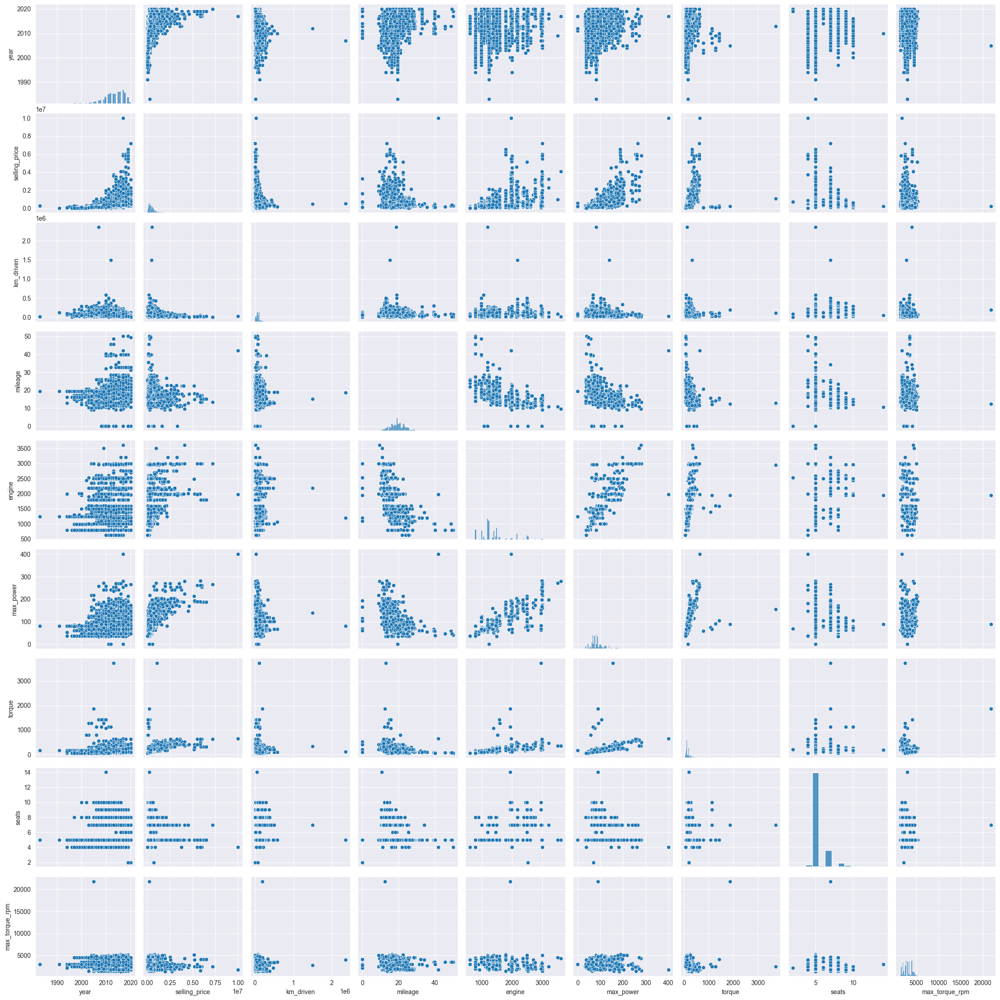

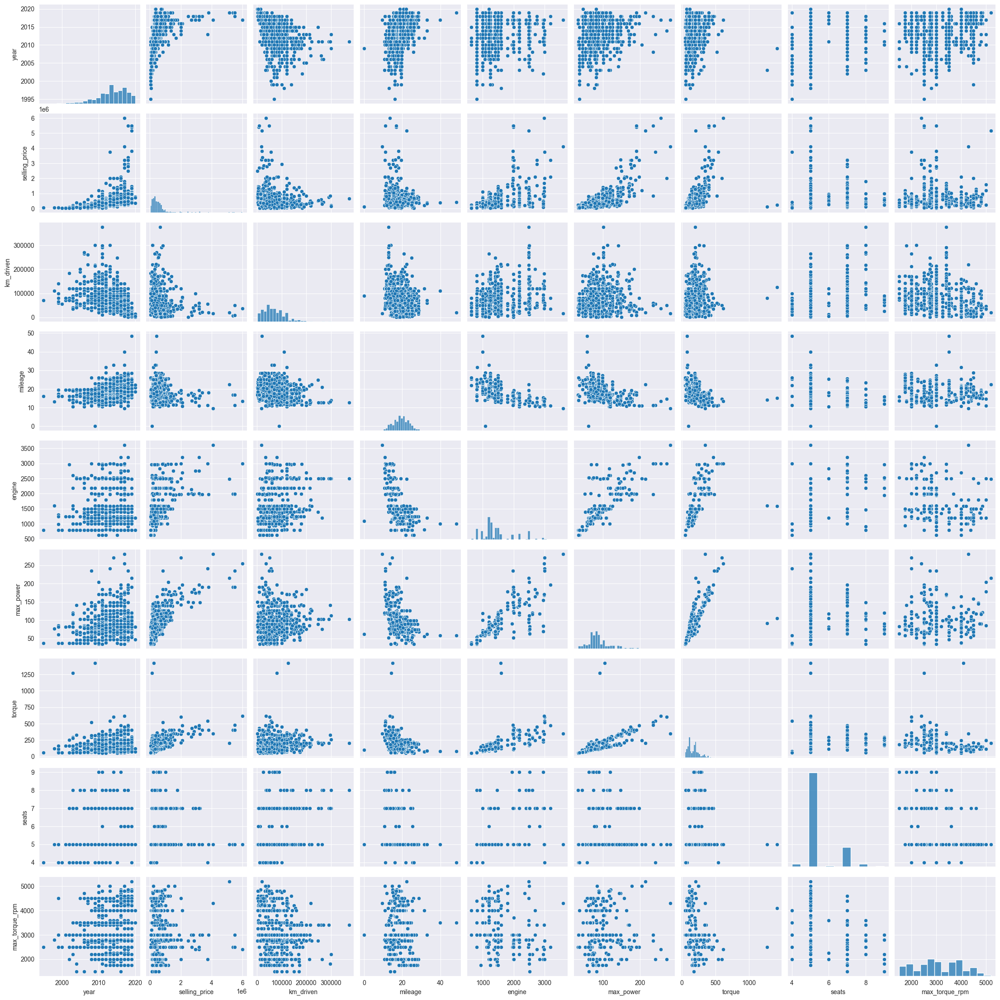

In [211]:
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = df_train.select_dtypes(include=['number']).columns.tolist()

sns.pairplot(df_train[num_cols])
plt.show()
sns.pairplot(df_test[num_cols])
plt.show()


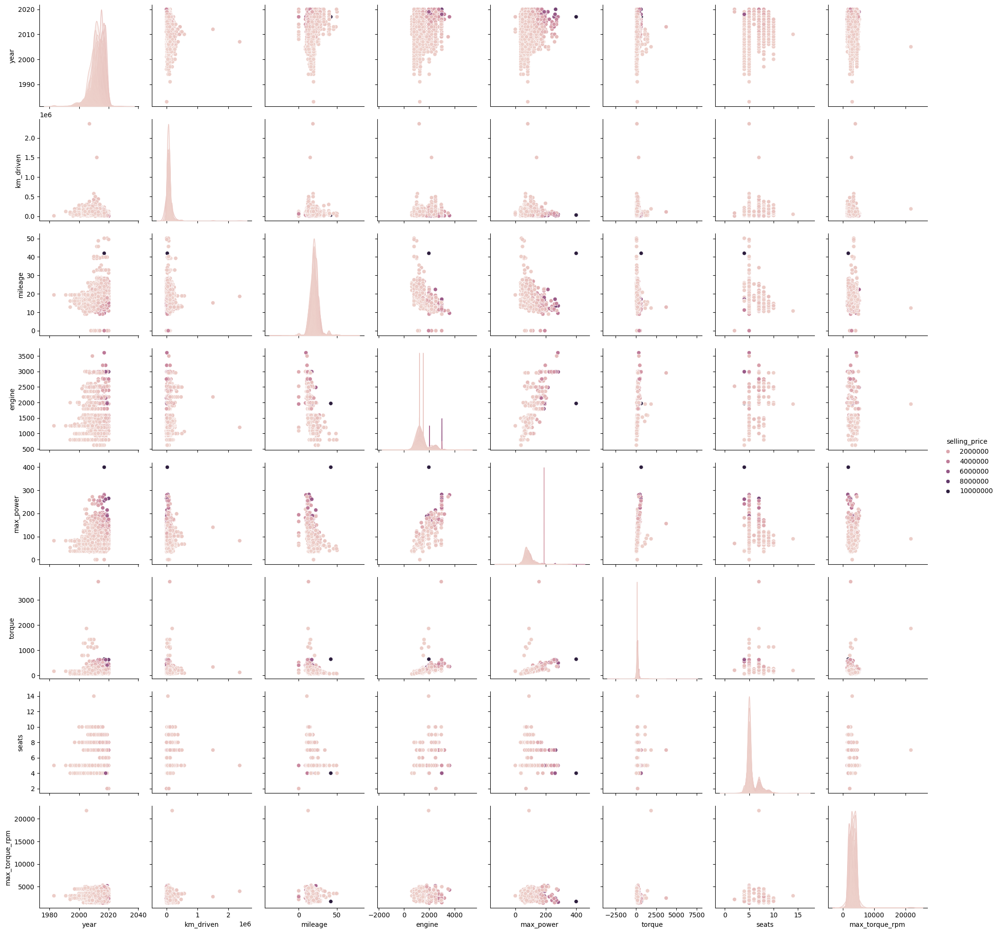

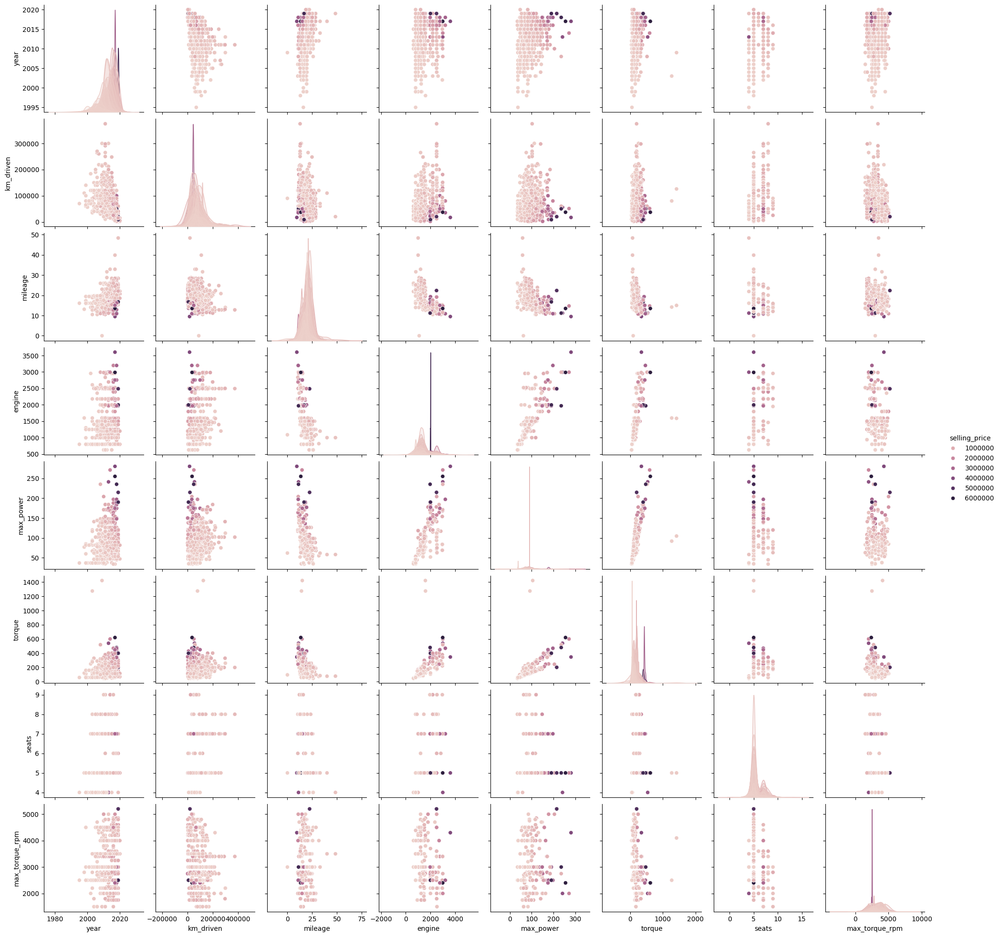

In [29]:
sns.pairplot(df_train[num_cols], hue='selling_price')
plt.show()
sns.pairplot(df_test[num_cols], hue='selling_price')
plt.show()

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [212]:
df_train[num_cols].corr()


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.427279,-0.368966,0.315735,0.002819,0.156858,0.048388,0.041178,0.047350
selling_price,0.427279,1.000000,-0.164828,-0.111942,0.447672,0.692814,0.433318,0.149953,-0.088502
km_driven,-0.368966,-0.164828,1.000000,-0.167888,0.229766,0.024588,0.106585,0.192328,-0.203421
mileage,0.315735,-0.111942,-0.167888,1.000000,-0.554392,-0.374232,-0.235179,-0.430069,-0.152418
engine,0.002819,0.447672,0.229766,-0.554392,1.000000,0.681117,0.566209,0.652172,-0.244349
max_power,0.156858,0.692814,0.024588,-0.374232,0.681117,1.000000,0.616399,0.244112,-0.023430
torque,0.048388,0.433318,0.106585,-0.235179,0.566209,0.616399,1.000000,0.298165,-0.249270
seats,0.041178,0.149953,0.192328,-0.430069,0.652172,0.244112,0.298165,1.000000,-0.206689
max_torque_rpm,0.047350,-0.088502,-0.203421,-0.152418,-0.244349,-0.023430,-0.249270,-0.206689,1.000000


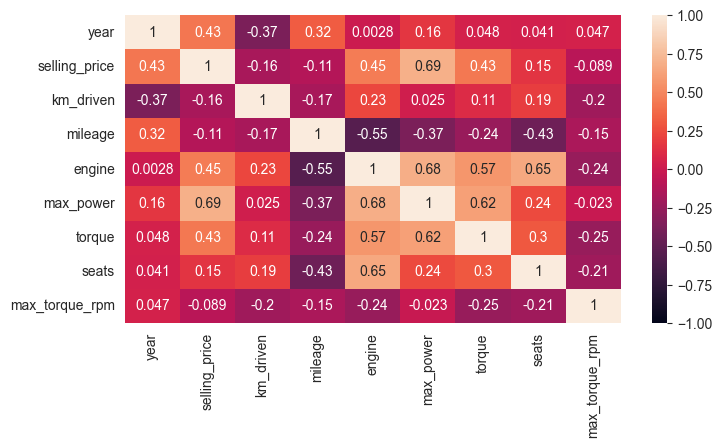

In [213]:
plt.figure(figsize=(8,4))
sns.heatmap(df_train[num_cols].corr(), annot=True, vmin=-1, vmax=1);
plt.show()

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой? `year-engine` (0.002819)
 - Между какими наблюдается довольно сильная положительная линейная зависимость? `selling_price-year`, `selling_price-max_power`, `selling_price-torque`, `selling_price-engine`, `max_power-engine`, `max_power-engine`, `seats-engine`
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи? K=-0.37. C уменьшением года количество километров  увеличивается, но эта зависимость не сильная. Формулировка  `Скорее всего` вряд ли уместна

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


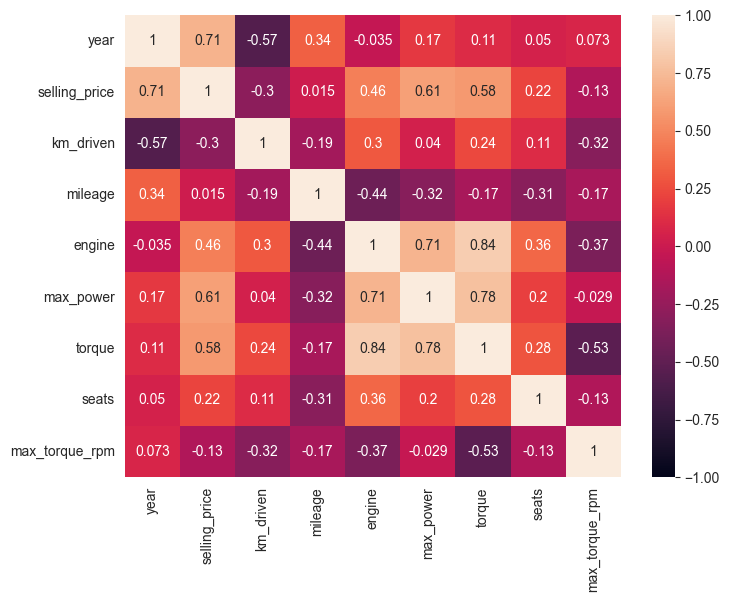

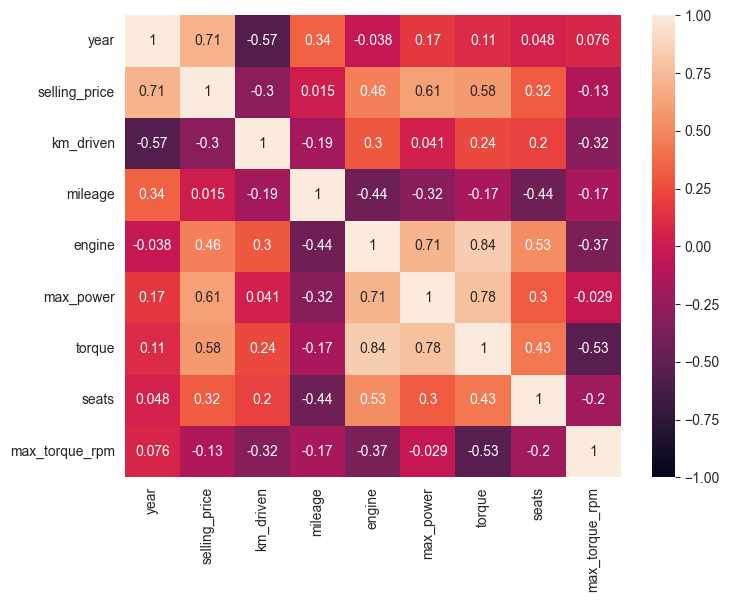

In [214]:
def spearman_correlation(x, y):
    assert len(y) == len(x), "Input arrays must have the same length."
    n = len(x)

    x_rank = np.argsort(np.argsort(x))
    y_rank = np.argsort(np.argsort(y))

    d = x_rank - y_rank
    d_squared = d * d

    coef = 1 - (6 * np.sum(d_squared)) / (n * (n**2 - 1))

    return coef

def make_spearman_matrix(df, num_cols):
    spearman_matrix = pd.DataFrame(index=num_cols, columns=num_cols)

    # Заполняем матрицу корреляции Спирмена
    for col1 in num_cols:
        for col2 in num_cols:
            spearman_matrix.loc[col1, col2] = spearman_correlation(df[col1], df[col2])

    # Преобразуем в числовой формат
    return spearman_matrix.astype(float)

plt.figure(figsize=(8, 6))
sns.heatmap(make_spearman_matrix(df_train, num_cols), annot=True, vmin=-1, vmax=1)
plt.show()

plt.figure(figsize=(8, 6))
sns.heatmap(df_train[num_cols].corr(method='spearman'), annot=True, vmin=-1, vmax=1)
plt.show()


interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


/Users/duke/miniconda3/envs/HSE-AI-HW-10/lib/python3.10/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable name is large: 1924. Are you sure this is not an interval variable? Analysis for pairs of variables including name can be slow.
  warnings.warn(


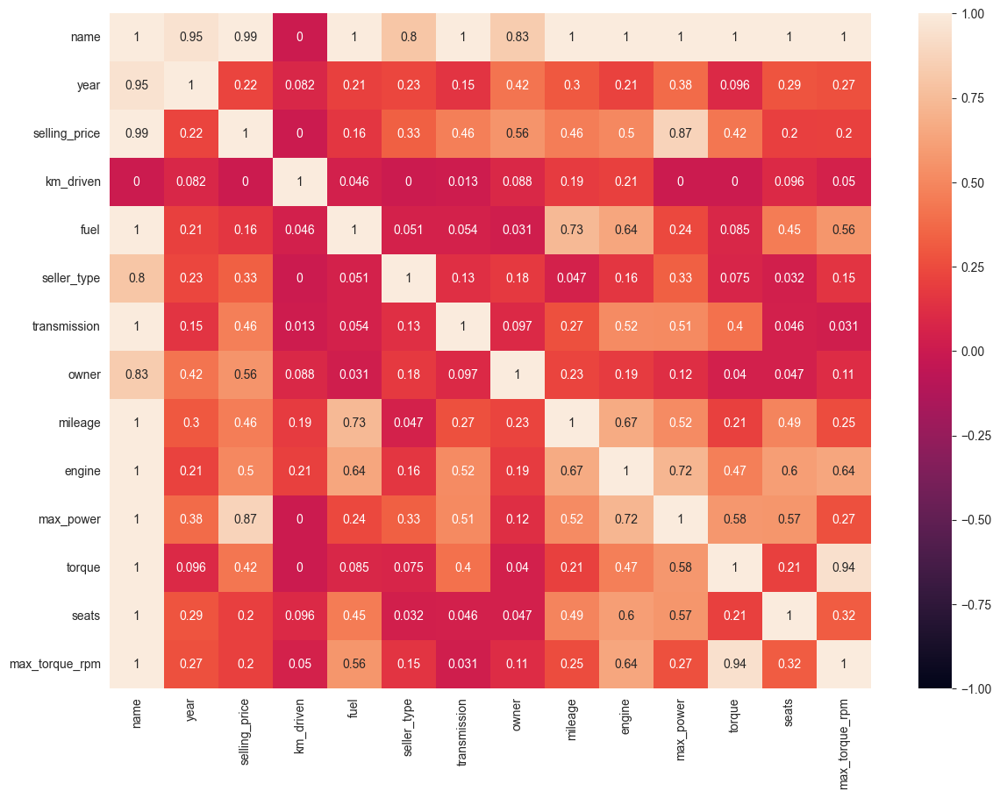

In [215]:

plt.figure(figsize=(14, 10))
sns.heatmap(df_train.phik_matrix(), annot=True, vmin=-1, vmax=1)
plt.show()

Результаты идентичны с точностью до 2 знака при сравнении кастомной и библиотечной реализации корреляции спирмана.

phik корреляция плохо замечает зависимость цены от `km_driven`. зато хооршо выявляет зависимости между кадегориальными и числовыми характеристиками, например типом топлива и хорокттеристиками двигателя. Если смотрить на строку цены, то можно убедиться, что почти все характеристики как-либо значимо связаны с целевой переменной.

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

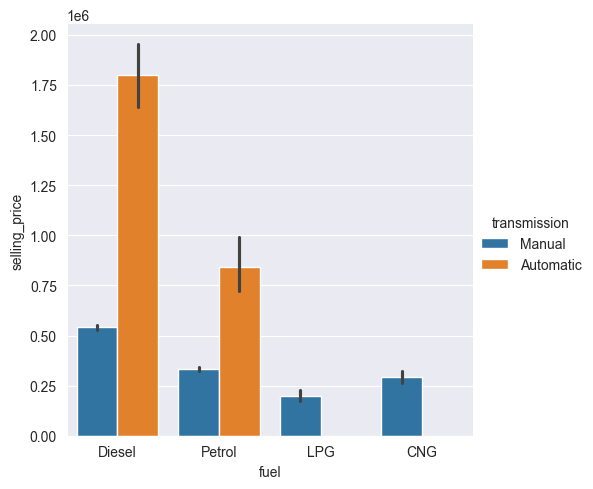

In [216]:
sns.catplot(
    x='fuel',
    y='selling_price',
    data=df_train,
    kind='bar',
    hue='transmission');
plt.show()


График демонстрирует зависимость цены автомобиля от типа топлива и трансмиссии.
Наиболее высокую среднюю цену имеют автомобили с дизельным двигателем и автоматической коробкой передач.
это еще раз родчеркивает премиальность дизельных автомобилей , которые исторически считались более престижными и мощными, что отражается в их более высокой цене.

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [217]:
df_train.dtypes

name               object
year                int64
selling_price       int64
km_driven           int64
fuel               object
seller_type        object
transmission       object
owner              object
mileage           float64
engine              int64
max_power         float64
torque            float64
seats               int64
max_torque_rpm    float64
dtype: object

In [59]:
nat_cols = ['mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'seats']

In [16]:

y_train =  df_train[['selling_price']]
X_train = df_train[nat_cols]


In [220]:
assert X_train.shape == (5840, 6)

In [17]:
y_test = df_test[['selling_price']]
X_test = df_test[nat_cols]

In [222]:
assert X_test.shape == (1000, 6)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [18]:
def show_score(y_train_, y_train_predicted, y_test_, y_test_predicted):

    r2_train = r2_score(y_train_, y_train_predicted)
    mse_train = MSE(y_train_, y_train_predicted)

    r2_test = r2_score(y_test_, y_test_predicted)
    mse_test = MSE(y_test_, y_test_predicted)

    # Выводим результаты
    print(f'R^2 train: {r2_train:.4f}')
    print(f'MSE train: {mse_train:.4f}')
    print(f'R^2 test: {r2_test:.4f}')
    print(f'MSE test: {mse_test:.4f}')


In [19]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

model_lr = LinearRegression()

model_lr.fit(X_train, y_train)

y_train_pred_lr = model_lr.predict(X_train)
y_test_pred_lr = model_lr.predict(X_test)

show_score(y_train, y_train_pred_lr, y_test, y_test_pred_lr)



R^2 train: 0.5084
MSE train: 140908436687.6737
R^2 test: 0.5339
MSE test: 267927319273.4330


- R^2 train: 0.5084, MSE train: 140908436687.6737 — модель объясняет примерно 51% вариации на трейне, но ошибки большие
- R^2 test: 0.5339, MSE test: 267927319273.4330 — немного лучше на тесте, но всё равно довольно высокие ошибки

 модель линейной регрессии работает слабо, объясняет только половину данных. Нужны улучшения - больше признаков, более сложные модели

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики
$$ R^2 = 1 -  \frac{\sum_{i=1}^{n}(y_i -  \hat{y}i )^2 } { \sum{i=1}^{n } (y_i - \bar{y})^2}  $$

- $y_i$ — значения целевой переменной (цена продажи)
- $\hat{y}_i$ — предсказанные значения
- $\bar{y}$ — среднее от реальных значений целевой переменной
- $n$ — количество наблюдений

In [20]:
def r2_score_manual(y, y_pred):
    y_mean = np.mean(y)
    ss_res = np.sum((y - y_pred) ** 2)
    ss_tot = np.sum((y - y_mean) ** 2)
    r2 = 1 - (ss_res / ss_tot)
    return r2

r2_score_manual(y_train, y_train_pred_lr)

/Users/duke/miniconda3/envs/HSE-AI-HW-10/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:84: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


selling_price    0.50841
dtype: float64

Результат совпадает с библиотечным

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [21]:
def adjusted_r2_score_manual(y, y_pred, df):
    p = df.shape[1]  # Количество признаков
    n = len(y) # Количество обучающих наблюдений
    r2 = r2_score_manual(y, y_pred)
    adj_r2 = 1 - (1 - r2) * (n - 1) / (n - p - 1)
    return adj_r2

adjusted_r2_score_manual(y_train, y_train_pred_lr, X_train)

/Users/duke/miniconda3/envs/HSE-AI-HW-10/lib/python3.10/site-packages/numpy/_core/fromnumeric.py:84: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


selling_price    0.507905
dtype: float64

Формула для Adjusted $R^2$ корректирует  R^2, уменьшая его, если добавление новых признаков не улучшает модель, а снижает ее точность (например, из-за переобучения).

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [22]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

model_sc = LinearRegression()
model_sc.fit(X_train_scaled, y_train)

y_train_pred_sc = model_sc.predict(X_train_scaled)
y_test_pred_sc = model_sc.predict(X_test_scaled)

show_score(y_train, y_train_pred_sc, y_test, y_test_pred_sc)


R^2 train: 0.5084
MSE train: 140908436687.6737
R^2 test: 0.5339
MSE test: 267927319273.4341


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены? `max_power`

In [23]:
def sort_coefficients(model_coef, features):
  coefs = pd.DataFrame({'feature': features, 'coef': model_coef})
  coefs['abs_coef'] = coefs['coef'].abs()
  coefs = coefs.sort_values('abs_coef', ascending=False)
  return coefs

important_features = sort_coefficients(model_sc.coef_[0], nat_cols)
print(important_features)

          feature           coef       abs_coef
2       max_power  401224.986425  401224.986425
0         mileage   97846.714241   97846.714241
4  max_torque_rpm  -19193.761900   19193.761900
5           seats   16586.570621   16586.570621
1          engine    9258.022926    9258.022926
3          torque   -7282.694281    7282.694281


### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [24]:
from sklearn.linear_model import Lasso

lasso_model = Lasso()
lasso_model.fit(X_train_scaled, y_train)

y_train_pred_lasso = lasso_model.predict(X_train_scaled)
y_test_pred_lasso = lasso_model.predict(X_test_scaled)

show_score(y_train, y_train_pred_lasso, y_test, y_test_pred_lasso)
print("Lasso coefs:")
print(sort_coefficients(lasso_model.coef_, nat_cols))
zeroed_coefficients = sum(lasso_model.coef_ == 0)
print(f"Зануленных весов {zeroed_coefficients} так как все признаки весомы")


R^2 train: 0.5084
MSE train: 140908436699.7559
R^2 test: 0.5339
MSE test: 267927681882.8053
Lasso coefs:
          feature           coef       abs_coef
2       max_power  401222.041824  401222.041824
0         mileage   97844.404465   97844.404465
4  max_torque_rpm  -19192.866133   19192.866133
5           seats   16585.108799   16585.108799
1          engine    9256.975237    9256.975237
3          torque   -7279.153658    7279.153658
Зануленных весов 0 так как все признаки весомы


### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей? `totalling 90 fits`
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
    - alpha - коэффициент регуляризации L1-регуляризации в Lasso-регрессии. При росте alpha регуляризация становится сильнее, коэффициенты модели уменьшаются и могут занулиться, меньшее же значение означает слабую регуляризацию, что ближе к линейной регрессии
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации? `100` нет

In [25]:
from sklearn.model_selection import GridSearchCV

lasso = Lasso()
params = {'alpha' : [ 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000, 1000000]}

gs = GridSearchCV(
    lasso,
    param_grid=params,
    scoring="neg_mean_squared_error",
    cv=10,
    verbose=1,
    n_jobs=-1
)

gs.fit(X_train_scaled, y_train)
y_train_pred_gcl = gs.predict(X_train_scaled)
y_test_pred_gcl = gs.predict(X_test_scaled)

show_score(y_train, y_train_pred_gcl, y_test, y_test_pred_gcl)

print(sort_coefficients(gs.best_estimator_.coef_, nat_cols))
gs.best_score_, gs.best_estimator_, gs.best_params_

Fitting 10 folds for each of 9 candidates, totalling 90 fits
R^2 train: 0.5084
MSE train: 140908557466.6841
R^2 test: 0.5338
MSE test: 267963651185.1259
          feature           coef       abs_coef
2       max_power  400930.344055  400930.344055
0         mileage   97615.934136   97615.934136
4  max_torque_rpm  -19104.092485   19104.092485
5           seats   16440.231471   16440.231471
1          engine    9153.726573    9153.726573
3          torque   -6928.640865    6928.640865


(np.float64(-144250575490.75287), Lasso(alpha=100), {'alpha': 100})

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей? `totalling 90 fits`
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей? `{'alpha': 0.01}`

In [26]:
from sklearn.linear_model import ElasticNet

elastic_net = ElasticNet(alpha=0.5, l1_ratio=0.5, random_state=42)  # l1_ratio: баланс L1 и L2
params = {'alpha' : [ 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000, 1000000]}

gs_en = GridSearchCV(
    elastic_net,
    param_grid=params,
    scoring="neg_mean_squared_error",
    cv=10,
    verbose=1,
    n_jobs=-1
)
gs_en.fit(X_train_scaled, y_train)
y_train_pred_gc_en = gs_en.predict(X_train_scaled)
y_test_pred_gc_en = gs_en.predict(X_test_scaled)

show_score(y_train, y_train_pred_gc_en, y_test, y_test_pred_gc_en)

print(sort_coefficients(gs_en.best_estimator_.coef_, nat_cols))
gs_en.best_score_, gs_en.best_estimator_, gs_en.best_params_

Fitting 10 folds for each of 9 candidates, totalling 90 fits
R^2 train: 0.5084
MSE train: 140919306288.7731
R^2 test: 0.5323
MSE test: 268821017169.9867
          feature           coef       abs_coef
2       max_power  395948.317300  395948.317300
0         mileage   97062.605038   97062.605038
4  max_torque_rpm  -18407.377849   18407.377849
5           seats   14900.554743   14900.554743
1          engine   12555.410470   12555.410470
3          torque   -5356.055717    5356.055717


(np.float64(-144261268628.12613),
 ElasticNet(alpha=0.01, random_state=42),
 {'alpha': 0.01})

### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [ ]:
import l0learn

l0_model = l0learn
user_lambda = [[1e-1, 1e-2, 1e-3, 1e-4]]
l0_model.fit(X_train_scaled,
             y_train['selling_price'].astype(float).to_numpy(),
               penalty="L0",
             algorithm="CD",
             lambda_grid=user_lambda,
               num_gamma=None,
               num_lambda=None,
               max_support_size=10)





# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [27]:
def process_name(df):
    df['name'] = df['name'].str.lower()
    print(f"{df['name'].nunique()=}")
    df[['brand', 'model', 'submodel']] = df['name'].str.split(' ', n=2, expand=True)
    df['drive_type'] = (df['submodel']
                              .str.extract(r'(4x4|4wd|2wd|4x2|2wd)', expand=False)
                              .fillna('2wd')
                              .replace('4wd', '4x4')
    )
    df['engine_w'] = (df['submodel']
                             .str.extract(r'(w\d+)', expand=False)
                              .fillna('no')
                            )
    df['comp'] = (df['submodel']
                             .str.extract(r'(\b[a-z]{2}i\b)', expand=False)
                              .fillna('no')
                            )
    df['submodel'] = (df['submodel']
                            .str.replace(' at', '')
                            .str.replace('at ', '')
                            .str.replace(r'[()/\-+]', '', regex=True)
                            .str.replace(r'(4x4|4wd|2wd|4x2|2wd|mt|r|vvt)', '', regex=True)
                            .str.replace(r'\b[a-zA-Z]{2}i\b', '', regex=True)
                            .str.replace(r'\bw\d+\b', '', regex=True)
                            .str.replace(r'\b\d+(\.\d+)?\b', '', regex=True)
                            .str.replace(')', '')
                            .str.replace('  ', ' ')
                            .str.strip()
                            .apply(lambda x: ' '.join(sorted([word for word in x.split() ])))
                            )
    print(f"{df['brand'].nunique()= } \n{df['model'].nunique()=} \n{df['drive_type'].nunique()=}\n"
          f"{df['engine_w'].nunique()=} \n{df['comp'].nunique()=} \n{df['submodel'].nunique()=}")

In [28]:
process_name(df_train)


df['name'].nunique()=1909
df['brand'].nunique()= 30 
df['model'].nunique()=200 
df['drive_type'].nunique()=3
df['engine_w'].nunique()=9 
df['comp'].nunique()=20 
df['submodel'].nunique()=1224


In [29]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm,brand,model,submodel,drive_type,engine_w,comp
0,maruti swift dzire vdi,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.00,5,2000.0,maruti,swift,dzie,2wd,no,vdi
1,skoda rapid 1.5 tdi ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.00,5,2500.0,skoda,rapid,ambition,2wd,no,tdi
2,hyundai i20 sportz diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.52,5,2750.0,hyundai,i20,diesel spotz,2wd,no,no
3,maruti swift vxi bsiii,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.70,5,4500.0,maruti,swift,bsiii,2wd,no,vxi
4,hyundai xcent 1.2 vtvt e plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.75,5,4000.0,hyundai,xcent,e plus vtvt,2wd,no,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,hyundai santro xing gls,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,96.10,5,3000.0,hyundai,santro,gls xing,2wd,no,no
5836,maruti wagon r vxi bs iv with abs,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,90.00,5,3500.0,maruti,wagon,abs bs iv with,2wd,no,vxi
5837,hyundai i20 magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,113.70,5,4000.0,hyundai,i20,magna,2wd,no,no
5838,hyundai verna crdi sx,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,235.20,5,2750.0,hyundai,verna,sx,2wd,no,no


In [30]:
X_train_cat = df_train[['brand', 'model', 'submodel','drive_type', 'engine_w', 'comp', 'year',  'fuel', 'seller_type', 'transmission', 'owner', 'seats', 'selling_price']]

interval columns not set, guessing: ['year', 'seats', 'selling_price']


/Users/duke/miniconda3/envs/HSE-AI-HW-10/lib/python3.10/site-packages/phik/data_quality.py:59: UserWarning: The number of unique values of variable submodel is large: 1224. Are you sure this is not an interval variable? Analysis for pairs of variables including submodel can be slow.
  warnings.warn(


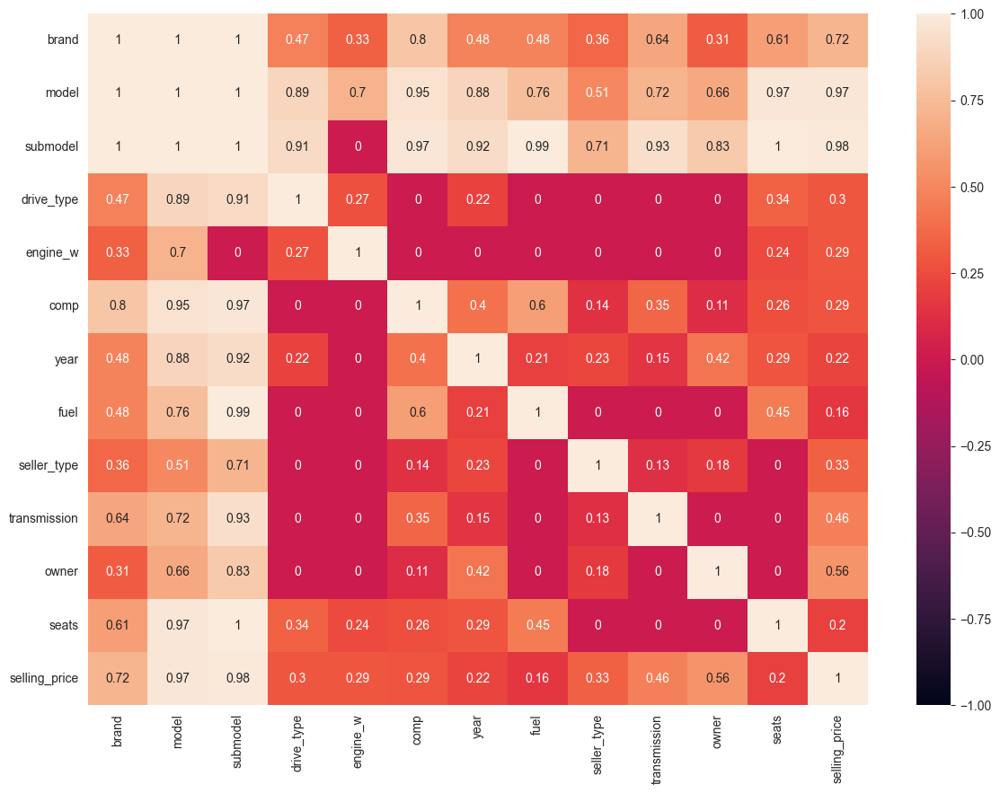

In [36]:
plt.figure(figsize=(14, 10))
phik_matrix_cars = X_train_cat.phik_matrix()
phik_matrix_cars = phik_matrix_cars.where(abs(phik_matrix_cars) >= 0.1, 0)
sns.heatmap(phik_matrix_cars, annot=True, vmin=-1, vmax=1)
plt.show()

In [37]:
X_train_cat = df_train[['brand', 'model', 'drive_type', 'engine_w', 'comp', 'year',  'fuel', 'seller_type', 'transmission', 'owner', 'seats']]


In [38]:
assert X_train_cat.shape == (5840, 11)

In [39]:
X_train_cat.describe(include='object')

,brand,model,drive_type,engine_w,comp,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840,5840,5840,5840,5840
unique,30,200,3,9,20,4,3,2,5
top,maruti,swift,2wd,no,no,Diesel,Individual,Manual,First Owner
freq,1804,558,5696,5721,4006,3177,5223,5336,3603


In [40]:
process_name(df_test)
char_cols = ['brand', 'model', 'drive_type', 'engine_w', 'comp', 'year',  'fuel', 'seller_type', 'transmission', 'owner', 'seats']
X_test_cat = df_test[char_cols]

df['name'].nunique()=611
df['brand'].nunique()= 25 
df['model'].nunique()=131 
df['drive_type'].nunique()=3
df['engine_w'].nunique()=5 
df['comp'].nunique()=17 
df['submodel'].nunique()=422


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [41]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

# Применяем OneHotEncoder к тренировочным данным
encoder = OneHotEncoder(handle_unknown='ignore' , drop='first')

X_train_encoded = encoder.fit_transform(X_train_cat)
X_test_encoded = encoder.transform(X_test_cat)



/Users/duke/miniconda3/envs/HSE-AI-HW-10/lib/python3.10/site-packages/sklearn/preprocessing/_encoders.py:246: UserWarning: Found unknown categories in columns [0, 1, 4] during transform. These unknown categories will be encoded as all zeros
  warnings.warn(


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

Нужно применять OHE только к категориальным признакам.
Важно быть осторожным с большим количеством уникальных категорий (brand).

Мы удаляем один столбец для предотвращения мультиколлинеарности, то есть  когда один столбец можно точно предсказать по другому. Удаление одного столбца (например, первого) из OHE помогает избежать линейной зависимости.

Корректно удалить неважные по весам признаки, если признаки не влияют на модель. Это помогает снизить размерность , что приводит к увеличению производительности

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов? `да, значительно`

In [42]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

param_grid = {'alpha': np.logspace(-6, 6, 13)}

ridge = Ridge()

gs_r = GridSearchCV(ridge, param_grid, cv=10, scoring='r2', verbose=1)
gs_r.fit(X_train_encoded, y_train)


print(f'{gs_r.best_params_["alpha"]=}')

y_train_pred_gsr = gs_r.predict(X_train_encoded)
y_test_pred_gsr = gs_r.predict(X_test_encoded)

show_score(y_train, y_train_pred_gsr , y_test, y_test_pred_gsr )
sort_coefficients(gs_r.best_estimator_.coef_, encoder.get_feature_names_out())


Fitting 10 folds for each of 13 candidates, totalling 130 fits
gs_r.best_params_["alpha"]=np.float64(0.1)
R^2 train: 0.9083
MSE train: 26298236072.0463
R^2 test: 0.9299
MSE test: 40285548614.5429


,feature,coef,abs_coef
215,model_xc90,5.533120e+06,5.533120e+06
213,model_x7,4.496634e+06,4.496634e+06
165,model_s-class,3.736994e+06,3.736994e+06
31,model_6,3.561423e+06,3.561423e+06
211,model_x4,3.330642e+06,3.330642e+06
...,...,...,...
13,brand_kia,-6.777664e+03,6.777664e+03
85,model_estilo,-6.229813e+03,6.229813e+03
245,comp_lsi,4.647077e+03,4.647077e+03
250,comp_sxi,1.815906e+03,1.815906e+03


In [96]:
param_grid = {'alpha': np.logspace(-6, 6, 13)}

ridge_full = Ridge()

gs_rf = GridSearchCV(ridge, param_grid, cv=10, scoring='r2', verbose=1)
gs_rf.fit(X_train_encoded, y_train)


print(f'{gs_r.best_params_["alpha"]=}')

y_train_pred_gsr = gs_r.predict(X_train_encoded)
y_test_pred_gsr = gs_r.predict(X_test_encoded)

show_score(y_train, y_train_pred_gsr , y_test, y_test_pred_gsr )
sort_coefficients(gs_r.best_estimator_.coef_, encoder.get_feature_names_out())

Fitting 10 folds for each of 13 candidates, totalling 130 fits
gs_r.best_params_["alpha"]=np.float64(0.1)
R^2 train: 0.9083
MSE train: 26298236072.0463
R^2 test: 0.9299
MSE test: 40285548614.5429


,feature,coef,abs_coef
215,model_xc90,5.533120e+06,5.533120e+06
213,model_x7,4.496634e+06,4.496634e+06
165,model_s-class,3.736994e+06,3.736994e+06
31,model_6,3.561423e+06,3.561423e+06
211,model_x4,3.330642e+06,3.330642e+06
...,...,...,...
13,brand_kia,-6.777664e+03,6.777664e+03
85,model_estilo,-6.229813e+03,6.229813e+03
245,comp_lsi,4.647077e+03,4.647077e+03
250,comp_sxi,1.815906e+03,1.815906e+03


# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!
`В принципе это уже реализовано мной выше - из имени получили несколько допфичей`

In [136]:
from sklearn.pipeline import Pipeline

categorical_features = [
    'brand', 'model',
    'drive_type',
    'engine_w',
    # 'comp',
    'year',
                        'fuel', 'seller_type',
    'transmission', 'owner', 'seats']
numerical_features = [
    'mileage',
    'engine',
                      'max_power', 'torque',
                      # 'max_torque_rpm',
                      'km_driven'
                      ]

# ohe для категориальных признаков
categorical_transformer = OneHotEncoder(handle_unknown='ignore',
                                        # drop='first'
                                        )

# нормализация для числовых
numerical_transformer = StandardScaler()

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

ridge = Ridge()
# ridge =  ElasticNet(alpha=0.5, l1_ratio=0.5, random_state=42)  # l1_ratio: баланс L1 и L2
params = {'ridge__alpha' : [ 0.01, 0.1, 1, 10, 100, 1000, 10000, 100000, 1000000]}

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('ridge', ridge)
])

gs_rf = GridSearchCV(pipeline, params, cv=10, scoring='r2', verbose=1)

X_full_train = df_train[categorical_features + numerical_features]
y_full_train = df_train['selling_price']

gs_rf.fit(X_full_train, y_full_train)

X_full_test = df_test[categorical_features + numerical_features]
y_full_test = df_test['selling_price']

Fitting 10 folds for each of 9 candidates, totalling 90 fits


In [131]:
print(f'{gs_rf.best_params_["ridge__alpha"]=}')

y_train_pred_gsrf = gs_rf.predict(X_full_train)
y_test_pred_gsrf = gs_rf.predict(X_full_test)

show_score(y_train, y_train_pred_gsrf , y_test, y_test_pred_gsrf )
# sort_coefficients(gs_rf.best_estimator_.coef_, encoder.get_feature_names_out()+numerical_features)
gs_rf.best_estimator_['ridge'].coef_

gs_rf.best_params_["ridge__alpha"]=0.1
R^2 train: 0.9125
MSE train: 25074993136.3567
R^2 test: 0.9258
MSE test: 42668392799.1752


array([ 1.32140282e+03, -6.76638001e+04,  1.48549740e+05,  4.49447425e+03,
       -1.46910631e+04, -2.79431009e+05,  5.07468742e+05,  1.63704356e+06,
       -5.79266889e+05, -2.98760553e+05, -5.67034578e+05, -5.88261355e+05,
       -3.35744464e+05, -4.88111657e+05, -5.70424936e+05, -5.60059759e+05,
        1.33808409e+05,  6.14213229e+05,  6.42074722e+05, -1.04270096e+05,
        6.13882787e+05,  1.55563690e+06, -5.33986218e+05, -5.95409586e+05,
        3.70953190e+05,  5.19115256e+04, -2.28024684e+05, -4.94004470e+05,
       -3.60941013e+05, -5.17863586e+05, -4.91165466e+05, -2.35379688e+05,
       -1.06100893e+05, -3.89369430e+05,  2.19661727e+06, -1.38575218e+06,
       -3.60941013e+05, -5.77753690e+05,  2.09762513e+06, -1.72054498e+06,
        1.05707041e+05,  2.75701915e+04,  2.83052851e+05, -2.97862883e+05,
        4.76568340e+05, -7.93909777e+04, -1.98534157e+05, -6.10890061e+04,
       -1.45747224e+05, -3.67474460e+05, -3.94584447e+05, -2.09447855e+05,
       -6.70998188e+04, -

-# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [132]:
def business_metrics(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    deviation = np.abs(y_pred - y_true) / y_true
    return np.mean(deviation <= 0.1)


print("linear " +str(business_metrics(y_test, y_test_pred_lr))+ " - best")
print("StandardScaler " +str(business_metrics(y_test, y_test_pred_sc)))
print("Lasso " +str(business_metrics(y_test, y_test_pred_lasso)))
print("GS Lasso " +str(business_metrics(y_test, y_test_pred_gcl)))
print("GS EN " +str(business_metrics(y_test, y_test_pred_gc_en)))
print("OHE " +str(business_metrics(y_test, y_test_pred_gsr)))
print("GS  Full " +str(business_metrics(y_test, y_test_pred_gsrf)))

linear 0.148 - best
StandardScaler 0.148
Lasso 0.075395
GS Lasso 0.075238
GS EN 0.075363
OHE 0.074468
GS  Full 0.074962


### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [133]:
def your_business_metrics(y_true, y_pred, pen_upper=1, pen_lower=10):
    # недопрогноз штрафуется сильнее, чем перепрогноз
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    rel_err = np.abs(y_pred - y_true) / y_true
    penalties = np.where(y_pred < y_true, pen_lower, pen_upper )

    weighted_error = rel_err * penalties
    return round(np.mean(weighted_error), 4)

print("linear " +str(your_business_metrics(y_test, y_test_pred_lr)) +" - best")
print("StandardScaler " +str(your_business_metrics(y_test, y_test_pred_sc)))
print("Lasso " +str(your_business_metrics(y_test, y_test_pred_lasso)))
print("GS Lasso " +str(your_business_metrics(y_test, y_test_pred_gcl)))
print("GS EN " +str(your_business_metrics(y_test, y_test_pred_gc_en)))
print("OHE " +str(your_business_metrics(y_test, y_test_pred_gsr)))
print("GS Full " +str(your_business_metrics(y_test, y_test_pred_gsrf)))

linear 3.0542 - best
StandardScaler 3.0542
Lasso 3.8319
GS Lasso 3.8306
GS EN 3.8159
OHE 4.0102
GS Full 4.0255


# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [137]:
import pickle
with open('./models/model_hw1_full.pkl', 'wb') as f:
    pickle.dump(gs_rf, f)

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядит проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>

In [ ]:
Сабрина